## Part I : Global includes



In [1]:

%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import os
import pathlib
from matplotlib import pyplot as plt
import torch
import numpy as np
import cv2
import tensorflow as tf

# Uncomment to disable GPU usage.
# This is required for some models like Pridnet which has too many traininable parameters
tf.config.set_visible_devices([], 'GPU')

from tqdm.notebook import tqdm
import random

import data_importer

In [2]:
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)

## Part II : Loading test images

In [37]:
#from sklearn.model_selection import train_test_split
from data_importer import load_training_images

noisy_array, gt_array = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data/', load_limited_images=True, num_images_to_load=10)

_n, _g = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Selected_Image_Pairs/', load_limited_images=False)

noisy_array = np.concatenate((noisy_array, _n), axis=0)
gt_array = np.concatenate((gt_array, _g), axis=0)

# Note : To get the comparision table, switch the below variables to noisy_array and gt_array, and dont run the cells of visualize_predictions.
extended_noisy_array, extended_gt_array = load_training_images('../../../../Dataset/LowDoseCTGrandChallenge/Training_Image_Data/', load_limited_images=True, num_images_to_load=100)
noisy_array = extended_noisy_array
gt_array = extended_gt_array

loaded training images x and y of len :  10 10  respectively
type of train images x :  float64
range of values in train images :  0.0 0.576171875
type of train images y :  float64
loaded training images x and y of len :  3 3  respectively
type of train images x :  float64
range of values in train images :  0.0 0.654541015625
type of train images y :  float64
loaded training images x and y of len :  100 100  respectively
type of train images x :  float64
range of values in train images :  0.0 0.576171875
type of train images y :  float64


Visualization of the noisy / ground truth image pair

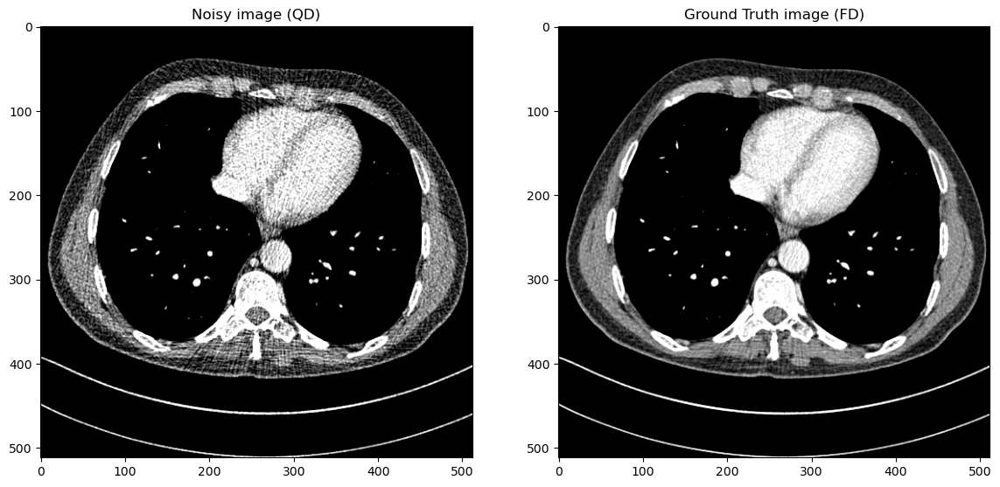

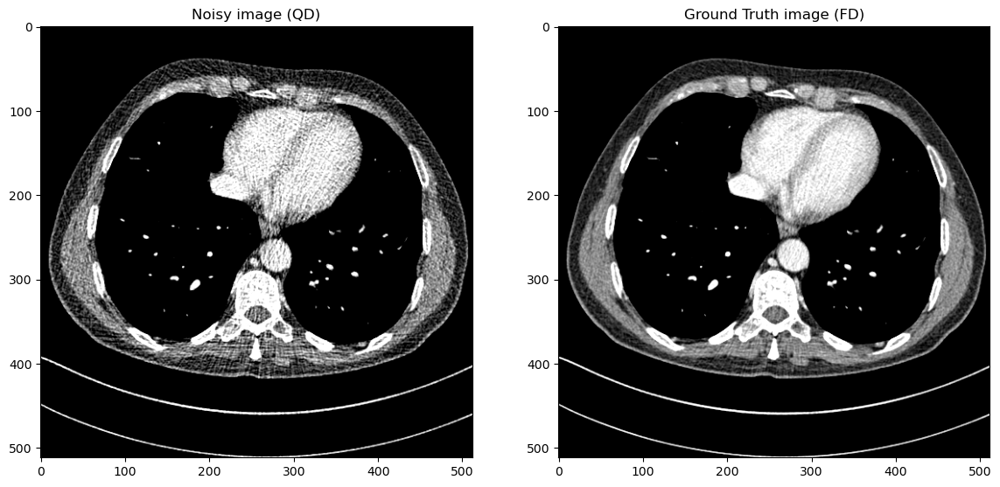

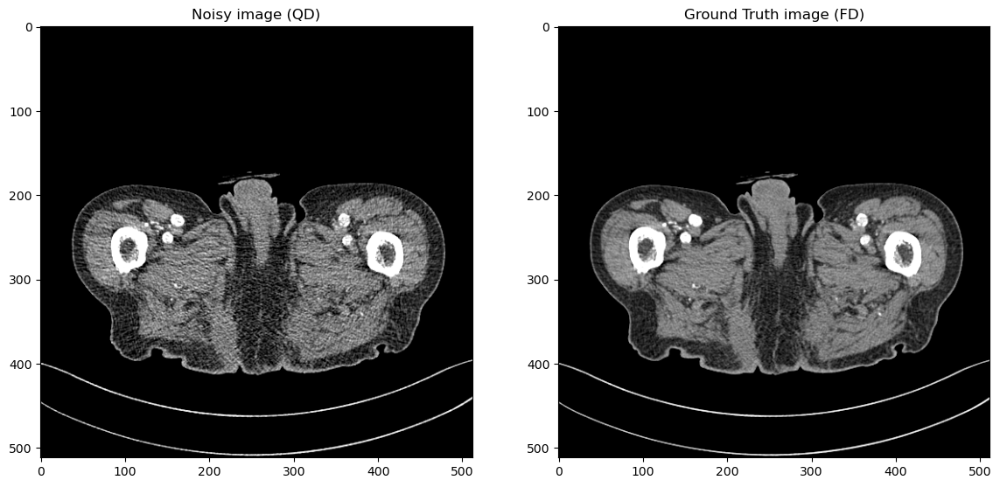

In [4]:
from data_importer import denormalize, trunc

for i in range(6, 14, 3):
    f, axarr = plt.subplots(1,2, figsize=(14,14))
    axarr[0].imshow(trunc(denormalize(noisy_array[i])), vmin=-160.0, vmax=240.0, cmap='gray')
    axarr[0].set_title("Noisy image (QD)")
    axarr[1].imshow(trunc(denormalize(gt_array[i])), vmin=-160.0, vmax=240.0, cmap='gray')
    axarr[1].title.set_text("Ground Truth image (FD)")
    plt.show()

### Part III : Setup for Inference

In [26]:
# Inference
def inference_single_image(model, noisy_image):
    input_image = np.expand_dims(noisy_image, axis=0)
    predicted_image = model.predict(input_image)
    a = np.abs(np.min(predicted_image))
    b = np.max(predicted_image)
    
    #predicted_image = predicted_image * (b - a) + a
    return predicted_image[0]

def inference_batch_images(model, noisy_images):
    input_image = noisy_images

    predicted_image = model.predict(input_image).astype(np.float64)
    return predicted_image

In [6]:
def rgb2gray(rgb):
    return np.expand_dims(np.dot(rgb[...,:3], [0.2989, 0.5870, 0.1140]), axis=-1)

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio
import sys
sys.path.append('../')

from metrics import compute_SSIM, compute_PSNR
from skimage.metrics import mean_squared_error  as mse

def calculate_psnr(original_image, reconstructed_image,range=400):
    return peak_signal_noise_ratio(original_image, reconstructed_image,data_range=range) 

    psnr_value = peak_signal_noise_ratio(original_image, reconstructed_image, data_range=240+160)
    return psnr_value

def calculate_ssim(original_image, reconstructed_image, range=400.0):    
    ssim_value = ssim(original_image.astype(np.int16), reconstructed_image.astype(np.int16), win_size=11, channel_axis=2, data_range=range)
    return ssim_value

def calculate_rmse(original_image, reconstructed_image):
    return mse(original_image, reconstructed_image)

def visualize_predictions(model, X_test, y_test, n, predictions, model_name):
    random_numbers = list(range(n)) # not very random
    for i in random_numbers:
        noisy_image = X_test[i].astype(np.float16)
        gt_image = y_test[i].astype(np.float16)
        predicted_image = predictions[i].astype(np.float16)

        if predicted_image.shape[-1] == 3:
            predicted_image = rgb2gray(predicted_image)
                                
            
        psnr_recon =  calculate_psnr(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
        psnr_qd =  calculate_psnr(trunc(denormalize(gt_image)),  trunc(denormalize(noisy_image)))
        ssim_recon = calculate_ssim(trunc(denormalize(gt_image)),  trunc(denormalize(predicted_image)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        rmse_recon = calculate_rmse(trunc(denormalize(gt_image)),  trunc(denormalize(predicted_image)))
        rmse_qd=calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        
        psnr_recon = round(psnr_recon, 4)
        psnr_qd = round(psnr_qd, 4)
        ssim_recon = round(ssim_recon, 4)
        ssim_qd = round(ssim_qd, 4)
        rmse_recon = round(rmse_recon, 4)
        rmse_qd = round(rmse_qd, 4)
        
        f, axarr = plt.subplots(1,3, figsize=(21,21))

        axarr[0].imshow(trunc(denormalize(noisy_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[0].set_title("QD Image : PSNR={}\nSSIM={}\nRMSE={}".format(psnr_qd, ssim_qd, rmse_qd))
        axarr[0].set_axis_off()
        axarr[1].imshow(trunc(denormalize(gt_image)),  cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[1].set_title("FD Image")
        axarr[1].set_axis_off()
        axarr[2].imshow(trunc(denormalize(predicted_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[2].set_title("{} Predicted Image : PSNR={}\nSSIM={}\nRMSE={}".format(model_name, psnr_recon, ssim_recon, rmse_recon))
        axarr[2].set_axis_off()
        
        plt.show()

In [7]:
from skimage.metrics import peak_signal_noise_ratio

def get_average_metrics(predicted_images, _gt_array, _noisy_array):
    psnr_original_mean = 0
    psnr_prediction_mean = 0

    ssim_original_mean = 0
    ssim_prediction_mean = 0

    mse_original_mean = 0
    mse_prediction_mean = 0

    if np.all(_gt_array) != None:
        gt_array = _gt_array
        noisy_array = _noisy_array
        

    i = 0
    for gt_img, noisy_img, predicted_img in zip(gt_array, noisy_array, predicted_images):
        predicted_img=  predicted_images[i]
        if predicted_img.shape[-1] == 3:
            predicted_img = rgb2gray(predicted_img)
            
        psnr_recon =  calculate_psnr(trunc(denormalize(gt_img)), trunc(denormalize(predicted_img)))
        psnr_qd =  calculate_psnr(trunc(denormalize(gt_img)),  trunc(denormalize(noisy_img)))
        ssim_recon = calculate_ssim(trunc(denormalize(gt_img)),  trunc(denormalize(predicted_img)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_img)), trunc(denormalize(noisy_img)))
        rmse_recon = calculate_rmse(trunc(denormalize(gt_img)),  trunc(denormalize(predicted_img)))
        rmse_qd=calculate_rmse(trunc(denormalize(gt_img)), trunc(denormalize(noisy_img)))

        psnr_original_mean += psnr_qd
        psnr_prediction_mean += psnr_recon
        
        ssim_original_mean += ssim_qd
        ssim_prediction_mean += ssim_recon

        mse_original_mean += rmse_qd
        mse_prediction_mean += rmse_recon
        
        i = i + 1        
    
    psnr_original_mean/=gt_array.shape[0]
    psnr_prediction_mean/=gt_array.shape[0]

    ssim_original_mean/=gt_array.shape[0]
    ssim_prediction_mean/=gt_array.shape[0]

    mse_original_mean/=gt_array.shape[0]
    mse_prediction_mean/=gt_array.shape[0]
    
    print("Original average gt-noisy PSNR ->", psnr_original_mean)
    print("Predicted average gt-predicted PSNR ->", psnr_prediction_mean)

    print("Original average gt-noisy SSIM ->", ssim_original_mean)
    print("Predicted average gt-predicted SSIM ->", ssim_prediction_mean)

    print("Original average gt-noisy MSE->", mse_original_mean)
    print("Predicted average gt-predicted MSE->", mse_prediction_mean)
    
    return round(psnr_prediction_mean, 4), round(ssim_prediction_mean, 4), round(mse_prediction_mean, 4), round(psnr_prediction_mean - psnr_original_mean, 4), round(ssim_prediction_mean - ssim_original_mean, 4), round(mse_prediction_mean - mse_original_mean, 4)


## Part IV : Evaluation of each model

## Model 1 : Hformer (for base reference)

In [8]:
sys.path.append('../denoising-models/hformer_vit/model/')
sys.path.append('../denoising-models/hformer_vit/')
from hformer_model_extended import get_hformer_model, PatchExtractor

hformer_model = get_hformer_model(num_channels_to_be_generated=64, name="hformer_model_extended")
hformer_model.build(input_shape=(None, 64, 64, 1))
hformer_model.load_weights('../denoising-models/hformer_vit/test/experiments/full_dataset/hformer_64_channel_custom_loss_epochs_48.h5')
print('Model summary : ')
print(hformer_model.summary())

Model summary : 
Model: "hformer_model_extended"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_projection_layer (Inp  multiple                 320       
 utProjectionLayer)                                              
                                                                 
 output_projection_layer (Ou  multiple                 257       
 tputProjectionLayer)                                            
                                                                 
 conv_net_block_1 (Convoluti  multiple                 36416     
 onBlock)                                                        
                                                                 
 conv_net_block_2 (Convoluti  multiple                 36416     
 onBlock)                                                        
                                                                 
 downsampling_layer_1 (Conv

In [9]:
def reconstruct_image_from_patches(patches, num_patches_per_row):
    patch_size = patches.shape[1]  # Assuming square patches
    num_patches = patches.shape[0]

    # Calculate the number of rows
    num_patches_per_col = num_patches // num_patches_per_row

    # Initialize an empty image to store the reconstructed result
    reconstructed_image = np.zeros((num_patches_per_col * patch_size, num_patches_per_row * patch_size))

    # Reshape the patches into a 2D array
    patches_2d = patches.reshape((num_patches_per_col, num_patches_per_row, patch_size, patch_size))
    # Reconstruct the image by placing each patch in its corresponding position

    for i in range(num_patches_per_col):
        for j in range(num_patches_per_row):
            reconstructed_image[i * patch_size:(i + 1) * patch_size, j * patch_size:(j + 1) * patch_size] = patches_2d[i, j]

    return np.expand_dims(reconstructed_image, axis=-1)

In [40]:
# View the predictions
patch_extractor = PatchExtractor(patch_size=64, stride=64, name="patch_extractor")
noisy_image_patches_array = patch_extractor(noisy_array)
extended_noisy_image_patches_array = patch_extractor(extended_noisy_array)

hformer_prediction_patches = hformer_model.predict(noisy_image_patches_array)
hformer_predictions = np.expand_dims(reconstruct_image_from_patches(hformer_prediction_patches[0:64], 8), axis=0)

for i in range(1, int(hformer_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(hformer_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    hformer_predictions = np.append(hformer_predictions, reconstructed_image, axis=0)

#visualize_predictions(hformer_predictions, noisy_array, gt_array, len(gt_array), hformer_predictions, "hformer")

200/200 [==============================] - 176s 877ms/step


## Model 2 : XModel 

In [11]:
from torchinfo import summary
sys.path.append('../denoising-models/novel_model/')
from x_denoiser import XModel 
x_model = XModel(num_channels=64)
x_model.load_state_dict(torch.load('../denoising-models/novel_model/weights/x_model/model_19.pth'))
x_model.eval()
print('Model summary : ')
print(summary(x_model))


Model summary : 
Layer (type:depth-idx)                        Param #
XModel                                        --
├─ConvTranspose2d: 1-1                        5
├─Conv2d: 1-2                                 16,448
├─InputProjectionLayer: 1-3                   --
│    └─Conv2d: 2-1                            640
├─OutputProjectionLayer: 1-4                  --
│    └─ConvTranspose2d: 2-2                   577
├─ConvBlock: 1-5                              --
│    └─ZeroPad2d: 2-3                         --
│    └─DepthWiseSeparableConv2d: 2-4          --
│    │    └─Conv2d: 3-1                       3,136
│    │    └─Conv2d: 3-2                       4,096
│    └─LayerNorm: 2-5                         --
│    └─Conv2d: 2-6                            803,072
│    └─GELU: 2-7                              --
│    └─Conv2d: 2-8                            16,448
├─ConvBlock: 1-6                              --
│    └─ZeroPad2d: 2-9                         --
│    └─DepthWiseSeparableCo

In [41]:
# Get prediction images.

x_model_prediction_patches = []

for img in noisy_array:
    img_tensor = torch.from_numpy(img).float()

    with torch.no_grad():
        output_tensor = x_model(img_tensor)
        output_tensor = output_tensor.cpu().numpy()

        x_model_prediction_patches.append(output_tensor)
    
#visualize_predictions(x_model, noisy_array, gt_array, len(gt_array), np.concatenate(x_model_prediction_patches,axis=0), "x_model")

## Model 3 : Y model

In [13]:
sys.path.append('../denoising-models/mwcnn/')
from y_denoiser import YModel
y_model = YModel(num_channels=56)
y_model.load_state_dict(torch.load('../denoising-models/novel_model/weights/y_model/model_24.pth'))
y_model.eval()
print('Model summary : ')
print(summary(y_model))

Model summary : 
Layer (type:depth-idx)                        Param #
YModel                                        --
├─InputProjectionLayer: 1-1                   --
│    └─Conv2d: 2-1                            560
├─OutputProjectionLayer: 1-2                  --
│    └─ConvTranspose2d: 2-2                   505
├─ConvBlock: 1-3                              --
│    └─ZeroPad2d: 2-3                         --
│    └─DepthWiseSeparableConv2d: 2-4          --
│    │    └─Conv2d: 3-1                       2,744
│    │    └─Conv2d: 3-2                       3,136
│    └─LayerNorm: 2-5                         --
│    └─Conv2d: 2-6                            614,880
│    └─GELU: 2-7                              --
│    └─Conv2d: 2-8                            12,600
├─YBlock: 1-4                                 --
│    └─Linear: 2-9                            3,192
│    └─Linear: 2-10                           3,192
│    └─Linear: 2-11                           3,192
│    └─Conv2d: 2-12  

In [42]:
# Get prediction images.

y_model_prediction_patches = []

for img in noisy_array:
    img_tensor = torch.unsqueeze(torch.from_numpy(img).float(), dim=0)

    
    with torch.no_grad():
        output_tensor = y_model(img_tensor)
        output_tensor = output_tensor.cpu().numpy()

        y_model_prediction_patches.append(output_tensor)
    

#visualize_predictions(y_model, noisy_array, gt_array, len(gt_array), np.concatenate(y_model_prediction_patches,axis=0), "y_model")

# Model 3 : SA Model

In [15]:

sys.path.append('../denoising-models/hformer_self_attention')
from torchinfo import summary


from hformer_sa_model import HformerSAModel 

sa_model = HformerSAModel(num_channels=64).cuda()
sa_model.load_state_dict(torch.load('../denoising-models/hformer_self_attention/weights/model_75.pth'))
sa_model.eval()
print('model summary\n', summary(sa_model, input_size=(64, 64, 64, 1)))


model summary
Layer (type:depth-idx)                        Output Shape              Param #
HformerSAModel                                [64, 64, 64, 1]           --
├─InputProjectionLayer: 1-1                   [64, 64, 64, 64]          --
│    └─Conv2d: 2-1                            [64, 64, 64, 64]          640
├─ConvBlock: 1-2                              [64, 64, 64, 64]          --
│    └─ZeroPad2d: 2-2                         [64, 64, 18, 18]          --
│    └─DepthWiseSeparableConv2d: 2-3          [64, 64, 18, 18]          --
│    │    └─Conv2d: 3-1                       [64, 64, 18, 18]          3,136
│    │    └─Conv2d: 3-2                       [64, 64, 18, 18]          4,096
│    └─Conv2d: 2-4                            [64, 256, 12, 12]         803,072
│    └─GELU: 2-5                              [64, 256, 12, 12]         --
│    └─Conv2d: 2-6                            [64, 64, 12, 12]          16,448
│    └─ZeroPad2d: 2-7                         [64, 64, 18, 18]   

In [43]:

sa_prediction_patches = []

with torch.no_grad():    
    for i, data in enumerate(noisy_image_patches_array):
        noisy = data
    
        predictions = sa_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        sa_prediction_patches.append(predictions.detach().cpu())
    
sa_prediction_patches = np.concatenate(sa_prediction_patches, axis=0)
sa_predictions = np.expand_dims(reconstruct_image_from_patches(sa_prediction_patches[0:64], 8), axis=0)


for i in range(1, int(sa_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(sa_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    sa_predictions= np.append(sa_predictions, reconstructed_image, axis=0)



#visualize_predictions(sa_model, noisy_array, gt_array, len(gt_array), sa_predictions, "sa model")


# Model 4 : Z Model

In [17]:

sys.path.append('../denoising-models/hformer_pytorch')
from torchinfo import summary

from z_model import ZModel 

z_model = ZModel(num_channels=16).cuda()
z_model.load_state_dict(torch.load('../denoising-models/hformer_pytorch/weights/z_model_159.pth'))
z_model.eval()
print('model summary\n', summary(z_model, input_size=(64, 64, 64, 1)))

Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master
Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


model summary
Layer (type:depth-idx)                        Output Shape              Param #
ZModel                                        [64, 64, 64, 1]           --
├─InputProjectionLayer: 1-1                   [64, 16, 64, 64]          --
│    └─Conv2d: 2-1                            [64, 16, 64, 64]          160
├─UNet: 1-2                                   [64, 16, 64, 64]          --
│    └─Sequential: 2-2                        [64, 16, 64, 64]          --
│    │    └─Conv2d: 3-1                       [64, 16, 64, 64]          2,304
│    │    └─BatchNorm2d: 3-2                  [64, 16, 64, 64]          32
│    │    └─ReLU: 3-3                         [64, 16, 64, 64]          --
│    │    └─Conv2d: 3-4                       [64, 16, 64, 64]          2,304
│    │    └─BatchNorm2d: 3-5                  [64, 16, 64, 64]          32
│    │    └─ReLU: 3-6                         [64, 16, 64, 64]          --
│    └─MaxPool2d: 2-3                         [64, 16, 32, 32]          --

In [44]:

z_prediction_patches = []

with torch.no_grad():    
    for i, data in enumerate(noisy_image_patches_array):
        noisy = data
    
        predictions = z_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        z_prediction_patches.append(predictions.detach().cpu())
    
z_prediction_patches = np.concatenate(z_prediction_patches, axis=0)
z_predictions = np.expand_dims(reconstruct_image_from_patches(z_prediction_patches[0:64], 8), axis=0)


for i in range(1, int(z_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(z_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    z_predictions= np.append(z_predictions, reconstructed_image, axis=0)
#visualize_predictions(z_model, noisy_array, gt_array, len(gt_array), z_predictions, "z model")


# Model 5 : W Model

In [19]:

sys.path.append('../denoising-models/hformer_pytorch')
from torchinfo import summary

from w_model import WModel 

w_model = WModel(num_channels=32).cuda()
w_model.load_state_dict(torch.load('../denoising-models/hformer_pytorch/weights/model_278.pth'))
w_model.eval()
print('model summary\n', summary(w_model, input_size=(64, 64, 64, 1)))

Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master
Using cache found in C:\Users\Tarun/.cache\torch\hub\mateuszbuda_brain-segmentation-pytorch_master


model summary
Layer (type:depth-idx)                   Output Shape              Param #
WModel                                   [64, 64, 64, 1]           --
├─InputProjectionLayer: 1-1              [64, 32, 64, 64]          --
│    └─Conv2d: 2-1                       [64, 32, 64, 64]          320
├─UNet: 1-2                              [64, 32, 64, 64]          --
│    └─Sequential: 2-2                   [64, 32, 64, 64]          --
│    │    └─Conv2d: 3-1                  [64, 32, 64, 64]          9,216
│    │    └─BatchNorm2d: 3-2             [64, 32, 64, 64]          64
│    │    └─ReLU: 3-3                    [64, 32, 64, 64]          --
│    │    └─Conv2d: 3-4                  [64, 32, 64, 64]          9,216
│    │    └─BatchNorm2d: 3-5             [64, 32, 64, 64]          64
│    │    └─ReLU: 3-6                    [64, 32, 64, 64]          --
│    └─MaxPool2d: 2-3                    [64, 32, 32, 32]          --
│    └─Sequential: 2-4                   [64, 64, 32, 32]       

In [54]:

w_prediction_patches = []

with torch.no_grad():    
    for i, data in enumerate(noisy_image_patches_array):
        noisy = data
    
        predictions = w_model(torch.unsqueeze(torch.from_numpy(noisy.numpy()), dim=0).to('cuda')).cpu()

        w_prediction_patches.append(predictions.detach().cpu())
    
w_prediction_patches = np.concatenate(w_prediction_patches, axis=0)

w_predictions = np.expand_dims(reconstruct_image_from_patches(w_prediction_patches[0:64], 8), axis=0)


for i in range(1, int(w_prediction_patches.shape[0] / 64)): 
    reconstructed_image = reconstruct_image_from_patches(w_prediction_patches[i * 64 : i * 64 + 64], num_patches_per_row=8)
    reconstructed_image = np.expand_dims(reconstructed_image, axis=0)

    w_predictions= np.append(w_predictions, reconstructed_image, axis=0)

#visualize_predictions(w_model, noisy_array, gt_array, len(gt_array), w_predictions, "w model")


In [72]:
# W model with wavelet
from pytorch_wavelets import DTCWTForward, DTCWTInverse
dwt = DTCWTForward(J=3).cuda()
idwt = DTCWTInverse().cuda()
wavelet_w_model_prediction_patches =[]


with torch.no_grad():
    for i in range(noisy_image_patches_array.shape[0] // 64):
        noisy = noisy_image_patches_array[i * 64 : i * 64 + 64]
        noisy = torch.from_numpy(noisy.cpu().numpy()).to('cuda')
        prediction = w_model(noisy)

        prediction_img = torch.transpose(prediction, 1, 3)
        transposed_noisy_image = torch.transpose(noisy, 1, 3)

        prediction_approx, prediction_high_freq = dwt(prediction_img.cuda())
        prediction_high_freq_low, prediction_high_freq_mid, prediction_high_freq_coarse = prediction_high_freq[0], prediction_high_freq[1], prediction_high_freq[2]

        noisy_approx, noisy_high_freq = dwt(transposed_noisy_image.cuda())

        noisy_high_freq_fine, noisy_high_freq_mid, noisy_high_freq_coarse = noisy_high_freq[0], noisy_high_freq[1] , noisy_high_freq[2]

        reconstructed_prediction_image_with_high_freq_swap = idwt((noisy_approx, noisy_high_freq))
        reconstructed_prediction_image_with_high_freq_swap = torch.transpose(reconstructed_prediction_image_with_high_freq_swap, 3, 1)


        #denoise_high_freq = torch.transpose(torch.from_numpy(denoised_high_freq), 1, 3)
        #denoised_noisy_approx, denoised_high_freq = dwt(denoise_high_freq.cuda())
        #noisy_high_freq_fine, noisy_high_freq_mid, noisy_high_freq_coarse = denoised_high_freq[0], denoised_high_freq[1] , denoised_high_freq[2]

        wavelet_high_freq_swapped = [None] * 3
        wavelet_high_freq_swapped[0] =noisy_high_freq_fine
        wavelet_high_freq_swapped[1] =prediction_high_freq_mid
        wavelet_high_freq_swapped[2] =prediction_high_freq_coarse

        reconstructed_prediction_image = idwt((prediction_approx,wavelet_high_freq_swapped))
        reconstructed_prediction_image = torch.transpose(reconstructed_prediction_image, 1, 3)
        wavelet_w_model_prediction_patches.append(reconstructed_prediction_image.detach().cpu().numpy())

wavelet_w_predictions = [None] * noisy_array.shape[0]
def reconstruct(patches,  num_images):
    num_patches_per_image = patches.shape[0] // num_images
    for i in range(num_images):
        
        image_patches = patches[i * num_patches_per_image:i * num_patches_per_image + num_patches_per_image]
        
        reconstruct_image = (reconstruct_image_from_patches(image_patches, 8))
        wavelet_w_predictions[i]  = reconstruct_image
wavelet_w_model_prediction_patches = np.concatenate(wavelet_w_model_prediction_patches)
reconstruct(wavelet_w_model_prediction_patches, 100)

## Part V : Side by side comparison of all models

In [73]:
from prettytable import PrettyTable

pt = PrettyTable()
pt.field_names = ["Model", "PSNR", "SSIM", "MSE", "PSNR Improvement", "SSIM improvement", "MSE Improvement"]

hformer_metrics = get_average_metrics(hformer_predictions, gt_array, noisy_array)
x_metrics= get_average_metrics(np.concatenate(x_model_prediction_patches, axis=0), gt_array, noisy_array)
y_metrics= get_average_metrics(np.concatenate(y_model_prediction_patches, axis=0), gt_array, noisy_array)
sa_metrics = get_average_metrics(sa_predictions, gt_array, noisy_array)
z_metrics = get_average_metrics(z_predictions, gt_array, noisy_array)
w_metrics = get_average_metrics(w_predictions, gt_array, noisy_array)
wavelet_w_metrics = get_average_metrics(wavelet_w_predictions, gt_array, noisy_array)


Original average gt-noisy PSNR -> 22.75797969597923
Predicted average gt-predicted PSNR -> 27.523600831115917
Original average gt-noisy SSIM -> 0.82834844080363
Predicted average gt-predicted SSIM -> 0.8723555743844719
Original average gt-noisy MSE-> 937.7143929672242
Predicted average gt-predicted MSE-> 304.4095022895431
Original average gt-noisy PSNR -> 22.75797969597923
Predicted average gt-predicted PSNR -> 8.230388637628527
Original average gt-noisy SSIM -> 0.82834844080363
Predicted average gt-predicted SSIM -> 0.4309663508291881
Original average gt-noisy MSE-> 937.7143929672242
Predicted average gt-predicted MSE-> 24932.838737335205
Original average gt-noisy PSNR -> 22.75797969597923
Predicted average gt-predicted PSNR -> 4.31976837224463
Original average gt-noisy SSIM -> 0.82834844080363
Predicted average gt-predicted SSIM -> -0.00017093112663178967
Original average gt-noisy MSE-> 937.7143929672242
Predicted average gt-predicted MSE-> 59183.96900197324
Original average gt-noisy

In [76]:
wavelet_w_metrics = get_average_metrics(wavelet_w_predictions, gt_array, noisy_array)

Original average gt-noisy PSNR -> 22.75797969597923
Predicted average gt-predicted PSNR -> 25.98327088001344
Original average gt-noisy SSIM -> 0.82834844080363
Predicted average gt-predicted SSIM -> 0.8658560925726855
Original average gt-noisy MSE-> 937.7143929672242
Predicted average gt-predicted MSE-> 443.0531792144853


In [77]:

pt = PrettyTable()
pt.field_names = ["Model", "PSNR", "SSIM", "MSE", "PSNR Improvement", "SSIM improvement", "MSE Improvement"]
pt.add_row(["Original X-y pairs (No Model)","22.75","0.82911", '-', '-', "-", "-"])
pt.add_row(["Hformer",str(hformer_metrics[0]), str(hformer_metrics[1]), str(round(hformer_metrics[2], 4)), str(round(hformer_metrics[3], 4)), str(round(hformer_metrics[4] * 100, 4)), str(hformer_metrics[5]) + '%'])
pt.add_row(["X Model",str(x_metrics[0]), str(x_metrics[1]), str(round(x_metrics[2], 4)), str(round(x_metrics[3], 4)), str(round(x_metrics[4] * 100, 4)), str(x_metrics[5]) + '%'])
pt.add_row(["Y Model",str(y_metrics[0]), str(y_metrics[1]), str(round(y_metrics[2], 4)), str(round(y_metrics[3], 4)), str(round(y_metrics[4] * 100, 4)), str(y_metrics[5]) + '%'])
pt.add_row(["SA Model",str(sa_metrics[0]), str(sa_metrics[1]), str(round(sa_metrics[2], 4)), str(round(sa_metrics[3], 4)), str(round(sa_metrics[4] * 100, 4)), str(sa_metrics[5]) + '%'])
pt.add_row(["Z Model",str(z_metrics[0]), str(z_metrics[1]), str(round(z_metrics[2], 4)), str(round(z_metrics[3], 4)), str(round(z_metrics[4] * 100, 4)), str(z_metrics[5]) + '%'])
pt.add_row(["W Model",str(w_metrics[0]), str(w_metrics[1]), str(round(w_metrics[2], 4)), str(round(w_metrics[3], 4)), str(round(w_metrics[4] * 100, 4)), str(w_metrics[5]) + '%'])
pt.add_row(["Wavelet W Model",str(wavelet_w_metrics[0]), str(wavelet_w_metrics[1]), str(round(wavelet_w_metrics[2], 4)), str(round(wavelet_w_metrics[3], 4)), str(round(wavelet_w_metrics[4] * 100, 4)), str(wavelet_w_metrics[5]) + '%'])

print(pt)

+-------------------------------+---------+---------+------------+------------------+------------------+-----------------+
|             Model             |   PSNR  |   SSIM  |    MSE     | PSNR Improvement | SSIM improvement | MSE Improvement |
+-------------------------------+---------+---------+------------+------------------+------------------+-----------------+
| Original X-y pairs (No Model) |  22.75  | 0.82911 |     -      |        -         |        -         |        -        |
|            Hformer            | 27.5236 |  0.8724 |  304.4095  |      4.7656      |       4.4        |    -633.3049%   |
|            X Model            |  8.2304 |  0.431  | 24932.8387 |     -14.5276     |      -39.74      |   23995.1243%   |
|            Y Model            |  4.3198 | -0.0002 | 59183.969  |     -18.4382     |      -82.85      |   58246.2546%   |
|            SA Model           | 22.6976 |  0.7929 |  915.8906  |     -0.0604      |      -3.55       |    -21.8238%    |
|            Z M

## Part 6 : Output of predictions of all 4 models side by side for direct visualize comparison

In [80]:
def visualize_predictions_all_models(X_test, y_test, n, hformer_predictions, x_predictions, y_predictions, sa_predictions, z_predictions, w_predictions, wavelet_w_predictions):
    random_numbers = list(range(n))  # not very random
    for i in range(10, 100, 10):
        noisy_image = X_test[i]
        gt_image = y_test[i]

        hformer_pred = hformer_predictions[i]
        x_pred = x_predictions[i]
        y_pred = y_predictions[i]
        sa_pred = sa_predictions[i]
        z_pred = z_predictions[i]
        w_pred = w_predictions[i]
        wavelet_w_pred = wavelet_w_predictions[i]

        models = ["HFORMER", "X", "Y", "SA",  "Z", "W", "Wavelet W"]
        predictions = [hformer_pred, x_pred, y_pred, sa_pred, z_pred, w_pred, wavelet_w_pred]

        # Display QD and FD images
        f, axarr = plt.subplots(1, 2 + len(models), figsize=(41,41))

        psnr_qd =  calculate_psnr(trunc(denormalize(gt_image)),  trunc(denormalize(noisy_image)))
        ssim_qd =calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))
        rmse_qd = calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(noisy_image)))

        axarr[0].imshow(trunc(denormalize(noisy_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[0].set_title("QD Image\nPSNR={}\nSSIM={}\nMSE={}".format(round(psnr_qd, 4), round(ssim_qd, 4), round(rmse_qd, 4)))

        axarr[0].set_axis_off()
        axarr[1].imshow(trunc(denormalize(gt_image)), cmap='gray', vmin=-160.0, vmax=240.0)
        axarr[1].set_title("FD Image")
        axarr[1].set_axis_off()

        for j, (model_name, predicted_image) in enumerate(zip(models, predictions), start=2):
            if predicted_image.shape[-1] == 3:
                predicted_image = rgb2gray(predicted_image)

            psnr_recon = calculate_psnr(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
            ssim_recon = calculate_ssim(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))
            rmse_recon = calculate_rmse(trunc(denormalize(gt_image)), trunc(denormalize(predicted_image)))

            psnr_recon = round(psnr_recon, 4)
            ssim_recon = round(ssim_recon, 4)
            mse_recon = round(rmse_recon, 4)

            axarr[j].imshow(trunc(denormalize(predicted_image)), cmap='gray', vmin=-160.0, vmax=240.0)
            axarr[j].set_title("{}\nPSNR={}\nSSIM={}\nMSE={}".format(model_name, psnr_recon, ssim_recon, mse_recon))
            axarr[j].set_axis_off()

        plt.savefig('../../output/novel_comparison_with_high_freq_wavelet/combined_outputs_image_index_{}.png'.format(i))
        plt.show()

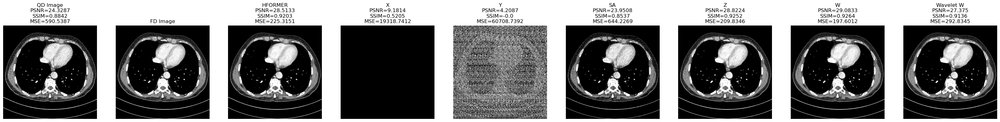

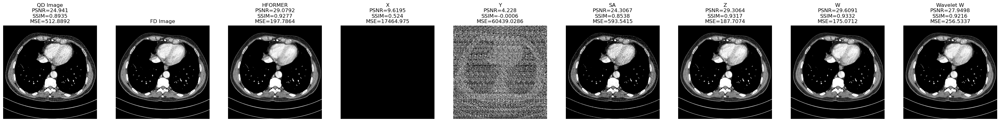

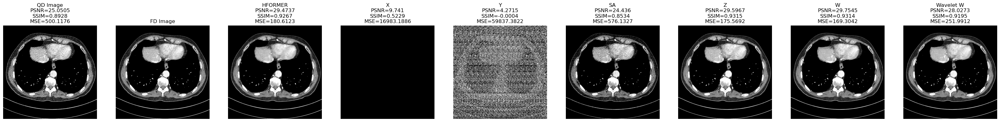

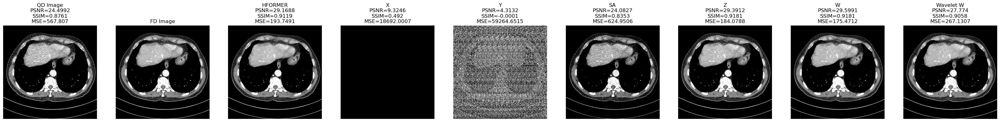

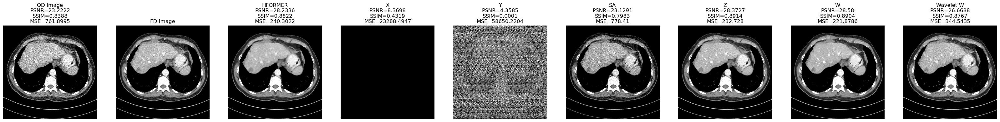

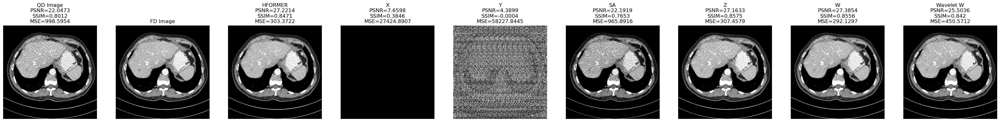

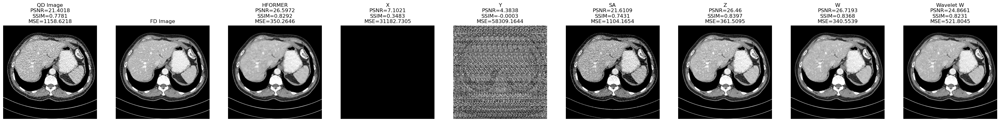

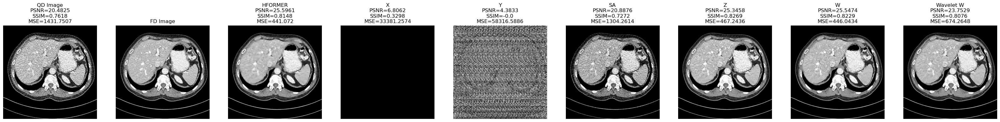

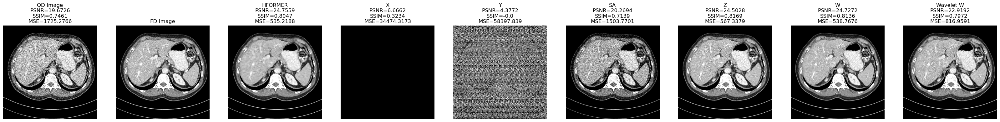

In [82]:

visualize_predictions_all_models(noisy_array, gt_array, 50, hformer_predictions, np.concatenate(x_model_prediction_patches, axis=0), np.concatenate(y_model_prediction_patches, axis=0), sa_predictions, z_predictions, w_predictions, wavelet_w_predictions)